#Install Tensorflow Object Detection

First, we'll install the TensorFlow Object Detection API in this Google Colab instance. This requires cloning the TensorFlow models repository and running a couple installation commands.

In [ ]:
# Clone the tensorflow models repository from GitHub
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3931, done.
remote: Counting objects: 100% (3931/3931), done.
remote: Compressing objects: 100% (3044/3044), done.
remote: Total 3931 (delta 1143), reused 1901 (delta 833), pack-reused 0
Receiving objects: 100% (3931/3931), 49.68 MiB | 16.50 MiB/s, done.
Resolving deltas: 100% (1143/1143), done.


In [ ]:
# Copy setup files into models/research folder
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
#cp object_detection/packages/tf2/setup.py .

In [ ]:
# Modify setup.py file to install the tf-models-official repository targeted at TF v2.8.0
import re
with open('/content/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/content/models/research/setup.py', 'w') as f:
    # Set fine_tune_checkpoint path
    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official==2.8.0', s)
    f.write(s)

In [ ]:
# Install the Object Detection API
# Need to do a temporary fix with PyYAML because Colab isn't able to install PyYAML v5.4.1
!pip install pyyaml==5.3
!pip install /content/models/research/

# Need to downgrade to TF v2.8.0 due to Colab compatibility bug with TF v2.10 (as of 10/03/22)
!pip install tensorflow==2.8.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.2/268.2 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.3-cp310-cp310-linux_x86_64.whl size=44243 sha256=a4e133595ff135a4a57d1eaa3a24185b4d0451095586210a5268bfa967f6ecf2
  Stored in directory: /root/.cache/pip/wheels/0d/72/68/a263cfc14175636cf26bada99f13b735be1b60a11318e08bfc
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.12.1 requires pyyaml>=5.3.1, but you have pyyaml 5.3 which is incompatible.
flax 0.7.0 requires PyYAML>=5.4.1, but you have pyyaml 5.3 which is incompatible.
Processing ./models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 497.6/497.6 MB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.5/462.5 kB 37.4 MB/s eta 0:00:00
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.1
    Uninstalling tensorflow-2.8.1:
      Successfully uninstalled tensorflow-2.8.1


You may get warnings or errors related to package dependencies in the previous code block, but you can ignore them for now.

Let's test our installation by running model_builder_tf2_test.py to make sure everything is working as expected. Run the following code block and confirm that it finishes without errors. If you get errors, try Googling them xD.

In [ ]:
# Run Model Bulider Test file, just to verify everything's working properly
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8FinalizeEPNS_15OpKernelContextESt8functionIFN3tsl8StatusOrINS5_4

if you get Ok we are clear to go to the next step.

#Upload Dataset and prepare Training Data

In this section, we'll upload our data and prepare it for training with TensorFlow. We'll upload our images, split them into train, validation, and test folders, and then run scripts for creating TFRecords from our data.

First, on your local PC, compress all your training images and XML files into a single folder called "images.rar". The files should be directly inside the rar folder, or in a nested folder as shown below:
```
images.rar
-- images
  -- img1.jpg
  -- img1.xml
  -- img2.jpg
  -- img2.xml
  ...
  

You can upload your images to your personal Google Drive, mount the drive on this Colab session, and copy them over to the Colab filesystem. This option works well if you want to upload the images beforehand so you don't have to wait for them to upload each time you restart this Colab. If you have more than 50MB worth of images, I recommend using this option.

First, upload the "images.zip" file to your Google Drive, and make note of the folder you uploaded them to. Replace MyDrive/path/to/images.rar with the path to your zip file. Then, run the following block of code to mount your Google Drive to this Colab session and copy the folder to this filesystem.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

!cp /content/gdrive/MyDrive/Projects/images.rar /content

Mounted at /content/gdrive


In [ ]:
!sudo apt-get install unrar


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1).
0 upgraded, 0 newly installed, 0 to remove and 15 not upgraded.


In [ ]:
import os
os.chdir('/content/')
!mkdir /content/images

!mkdir /content/images/train; mkdir /content/images/validation; mkdir /content/images/test

In [ ]:
import os
images_dir = "/content/images/"



In [ ]:
os.chdir(images_dir)
!unrar x /content/images.rar



UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/images.rar

Creating    images                                                    OK
Extracting  images/Cars0.png                                               0%  OK 
Extracting  images/Cars0.xml                                               0%  OK 
Extracting  images/Cars1.png                                               0%  OK 
Extracting  images/Cars1.xml                                               0%  OK 
Extracting  images/Cars10.png                                              0%  OK 
Extracting  images/Cars10.xml                                              0%  OK 
Extracting  images/Cars100.png                                             0%  OK 
Extracting  images/Cars100.xml                                             0%  OK 
Extracting  images/Cars101.png                                            

the following 3 blocks of code define how to delete folder contents in case of need

In [ ]:
def clean_folders(directory):
    # Check if the directory exists, and if it does, remove all its contents.
    if os.path.exists(directory):
        for filename in os.listdir(directory):
            file_path = os.path.join(directory, filename)
            if os.path.isfile(file_path) or os.path.islink(file_path):
                os.unlink(file_path)
            elif os.path.isdir(file_path):
                shutil.rmtree(file_path)

In [ ]:
root_directory = '/content/'


In [ ]:

clean_folders(os.path.join(root_directory, 'train'))
clean_folders(os.path.join(root_directory, 'validation'))
clean_folders(os.path.join(root_directory, 'test'))
clean_folders(os.path.join(root_directory, 'images'))


This code moves the files(images and their corresponding xml files) from the directory '/images/images/' to the corresponding '/images/train', '/images/validation', '/images/test' following the percentages: 80%, 10%, 10%.

In [ ]:
import os
import random
import shutil

# Set the path to the root directory containing 'images', 'train', 'validation', and 'test' folders.
root_directory = '/content'

# Set the percentage of images for the training set.
train_percentage = 0.8
validation_percentage = 0.1

def move_files(root_directory, train_percentage, validation_percentage):
    image_dir = os.path.join(root_directory, 'images', 'images')

    # Get the list of image and XML files in the 'images/images' folder.
    image_files = [file for file in os.listdir(image_dir) if file.endswith('.png') or file.endswith('.xml')]

    # Sort the list of files to maintain correspondence between PNG and XML files.
    image_files.sort()

    # Calculate the number of files for the training set.
    num_files = len(image_files)
    num_train = int(num_files * train_percentage)
    num_validation = int(num_files * validation_percentage)

    # Move images and XML files to the 'train' directory.
    for i in range(num_train):
        file_name = image_files[i]
        file_src = os.path.join(image_dir, file_name)
        shutil.move(file_src, os.path.join(root_directory, 'images', 'train', file_name))

    # Move images and XML files to the 'validation' directory.
    for i in range(num_train, num_train + num_validation):
        file_name = image_files[i]
        file_src = os.path.join(image_dir, file_name)
        shutil.move(file_src, os.path.join(root_directory, 'images', 'validation', file_name))

    # Move the remaining files to the 'test' directory.
    for i in range(num_train + num_validation, num_files):
        file_name = image_files[i]
        file_src = os.path.join(image_dir, file_name)
        shutil.move(file_src, os.path.join(root_directory, 'images', 'test', file_name))

# Move the files to the respective folders.
move_files(root_directory, train_percentage, validation_percentage)




#Create Labelmap and TFRecords

Finally, we need to create a labelmap for the detector and convert the images into a data file format called TFRecords, which are used by TensorFlow for training. We'll use Python scripts to automatically convert the data into TFRecord format. Before running them, we need to define a labelmap for our classes.

The code section below will create a "labelmap.txt" file that contains a list of classes. Replace the class1, class2, class3 text with your own classes (for example, cats, dogs), adding a new line for each class. Then, click play to execute the code.


In [ ]:
### This creates a a "labelmap.txt" file with a list of classes the object detection model will detect.
%%bash
cat <<EOF >> /content/labelmap.txt
licence
EOF

The last step was crucial, the licence tag was not defined randomly, in order to create our labelmap we must open the xml files, and check the tag names there.
for exemple looking at car0.xml :




In [ ]:
xml_content = """
<annotation>
    <folder>images</folder>
    <filename>Cars0.png</filename>
    <size>
        <width>500</width>
        <height>268</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>licence</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>226</xmin>
            <ymin>125</ymin>
            <xmax>419</xmax>
            <ymax>173</ymax>
        </bndbox>
    </object>
</annotation>
"""

print(xml_content)


<annotation>
    <folder>images</folder>
    <filename>Cars0.png</filename>
    <size>
        <width>500</width>
        <height>268</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>licence</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>226</xmin>
            <ymin>125</ymin>
            <xmax>419</xmax>
            <ymax>173</ymax>
        </bndbox>
    </object>
</annotation>



We notice that the objects are named : licence as we only have one class

# Convert XML files to  CSV


This script converts XML files containing object detection annotations into CSV format.
Each XML file corresponds to an image and contains information about the image size, object class, and bounding box coordinates.
The resulting CSV file will have one row per object instance detected in the image.
The script processes both the training and validation datasets and saves the output CSV files for each dataset.
Note: The input XML files should be organized in the 'train' and 'validation' folders under the '/content/images' directory.

In [ ]:
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET

# Function to convert XML annotations to a CSV format
def xml_to_csv(path):
    xml_list = []

    # Iterate through each XML file in the specified directory
    for xml_file in glob.glob(path + '/*.xml'):
        # Parse the XML tree
        tree = ET.parse(xml_file)
        root = tree.getroot()

        # Extract information for each 'object' element in the XML
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,  # Class label
                     int(member[5][0].text),  # xmin
                     int(member[5][1].text),  # ymin
                     int(member[5][2].text),  # xmax
                     int(member[5][3].text)   # ymax
                     )
            xml_list.append(value)

    # Define column names for the CSV
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']

    # Create a pandas DataFrame from the XML data
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

# Main function to convert XML annotations to CSV files
def main():
    # Iterate through 'train' and 'validation' folders
    for folder in ['train', 'validation']:
        # Define the absolute path to the image directory
        image_path = os.path.join('/content/images', folder)

        # Convert XML annotations to a DataFrame
        xml_df = xml_to_csv(image_path)

        # Define the output path for the CSV file
        output_path = os.path.join('/content/images', folder + '_labels.csv')

        # Save the DataFrame as a CSV file
        xml_df.to_csv(output_path, index=None)

        # Print a success message
        print(f'Successfully converted xml to csv for {folder}.')

# Execute the main function if this script is run directly
if __name__ == '__main__':
    main()



Successfully converted xml to csv for train.
Successfully converted xml to csv for validation.


Note: in the following code
        

In [ ]:
print('''int(member[5][0].text)
      int(member[5][1].text),
      int(member[5][2].text),
      int(member[5][3].text)''')

int(member[5][0].text)
      int(member[5][1].text),
      int(member[5][2].text),
      int(member[5][3].text)


the 5 in member[5] is set accordingly to your xml files in the custom dataset. They refer the coordinates of the boudning box, as we observe the coordinants are the 5th member of the object class in the xml file.

#Generate TF records

This script converts image dataset annotations from CSV format into TFRecord files, which are essential for training object detection models with the TensorFlow Object Detection API. It also generates a label map file for mapping class labels. The process is automated and efficient, making it convenient for preparing data in Colab notebooks for custom object detection model training.
TFRecords are a format in TensorFlow that store data efficiently for machine learning. They're faster to read, support parallel processing, and work well with TensorFlow's tools. TFRecords are great for large datasets, handle various data types, and integrate smoothly with TensorFlow's data pipeline. Using them can speed up training and ensure data consistency.

In [ ]:
import os
os.chdir('/content/')

In [ ]:
! wget https://raw.githubusercontent.com/KhalilElAmine/ANPR/master/create_tfrecord.py

--2023-08-02 20:00:19--  https://raw.githubusercontent.com/KhalilElAmine/ANPR/master/create_tfrecord.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4414 (4.3K) [text/plain]
Saving to: ‘create_tfrecord.py’

create_tfrecord.py  100%[===================>]   4.31K  --.-KB/s    in 0s      

2023-08-02 20:00:20 (51.8 MB/s) - ‘create_tfrecord.py’ saved [4414/4414]



In [ ]:
import os
os.chdir('/content/')

In [ ]:
!python create_tfrecord.py --csv_input=/content/images/train_labels.csv --labelmap=/content/labelmap.txt --image_dir=/content/images/train --output_path=/content/train.tfrecord
!python create_tfrecord.py --csv_input=/content/images/validation_labels.csv --labelmap=/content/labelmap.txt --image_dir=/content/images/validation --output_path=/content/validation.tfrecord


Successfully created the TFRecords: /content/train.tfrecord
Successfully created the TFRecords: /content/validation.tfrecord


We'll store the locations of the TFRecord and labelmap files as variables so we can reference them later in this Colab session.

In [ ]:
train_record_fname = '/content/train.tfrecord'
val_record_fname = '/content/validation.tfrecord'
label_map_pbtxt_fname = '/content/labelmap.pbtxt'

# Set Up Training Configuration

In this section, we'll set up the model and training configuration. We'll specifiy which pretrained TensorFlow model we want to use from the TensorFlow 2 Object Detection Model Zoo. Each model also comes with a configuration file that points to file locations, sets training parameters (such as learning rate and total number of training steps), and more. We'll modify the configuration file for our custom training job.

The first section of code lists out some models availabe in the TF2 Model Zoo and defines some filenames that will be used later to download the model and config file. This makes it easy to manage which model you're using and to add other models to the list later.

Set the "chosen_model" variable to match the name of the model you'd like to train with. It's currently set to use the popular "ssd-mobilenet-v2" model. Click play on the next block once the chosen model has been set

In [ ]:
# Change the chosen_model variable to deploy different models available in the TF2 object detection zoo
chosen_model = 'ssd-mobilenet-v2-fpnlite-320'

MODELS_CONFIG = {
    'ssd-mobilenet-v2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz',
    },
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
    },
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    },
    # The centernet model isn't working as of 9/10/22
    #'centernet-mobilenet-v2': {
    #    'model_name': 'centernet_mobilenetv2fpn_512x512_coco17_od',
    #    'base_pipeline_file': 'pipeline.config',
    #    'pretrained_checkpoint': 'centernet_mobilenetv2fpn_512x512_coco17_od.tar.gz',
    #}
}

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']

The chosen model, 'ssd-mobilenet-v2-fpnlite-320', is selected for its balance between accuracy and speed, making it suitable for real-time object detection tasks on resource-constrained devices.

In [ ]:
# Create "mymodel" folder for holding pre-trained weights and configuration files
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Download pre-trained model weights
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Download training configuration file for model
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/mymodel
--2023-08-02 20:00:59--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.251.12.128, 2404:6800:4003:c11::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.251.12.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  14.7MB/s    in 1.3s    

2023-08-02 20:01:02 (14.7 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

--2023-08-02 20:01:03--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 1

In [ ]:
# Set training parameters for the model
num_steps = 10000

if chosen_model == 'efficientdet-d0':
  batch_size = 4
else:
  batch_size = 16

This code section sets up essential file paths and retrieves the number of classes for the model's configuration. It defines the paths for the training configuration and pre-trained model checkpoint. The get_num_classes() function calculates the total number of classes using the label map, ensuring accurate class count. The resulting num_classes variable holds this count, which is then displayed through a print statement. This preparation step is crucial for configuring the model and label mapping before training.

In [ ]:
# Set file locations and get number of classes for config file
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)


Total classes: 1


In this code segment, a customized configuration file is generated by modifying a base pipeline file. Using regular expressions, the script updates key parameters such as fine-tune checkpoint, dataset paths, label map, batch size, training steps, and class count. Model-specific adjustments are made for optimal training, like adjusting learning rates and resizing strategies. The resulting 'pipeline_file.config' file is tailored to the chosen model and dataset, ensuring effective setup for object detection training.

In [ ]:
# Create custom configuration file by writing the dataset, model checkpoint, and training parameters into the base pipeline file
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # Set fine_tune_checkpoint path
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # Set tfrecord files for train and test datasets
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    # Set label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    # If using ssd-mobilenet-v2, reduce learning rate (because it's too high in the default config file)
    if chosen_model == 'ssd-mobilenet-v2':
      s = re.sub('learning_rate_base: .8',
                 'learning_rate_base: .08', s)

      s = re.sub('warmup_learning_rate: 0.13333',
                 'warmup_learning_rate: .026666', s)

    # If using efficientdet-d0, use fixed_shape_resizer instead of keep_aspect_ratio_resizer (because it isn't supported by TFLite)
    if chosen_model == 'efficientdet-d0':
      s = re.sub('keep_aspect_ratio_resizer', 'fixed_shape_resizer', s)
      s = re.sub('pad_to_max_dimension: true', '', s)
      s = re.sub('min_dimension', 'height', s)
      s = re.sub('max_dimension', 'width', s)

    f.write(s)

/content/models/mymodel
writing custom configuration file


In [ ]:
# (Optional) Display the custom configuration file's contents
!cat /content/models/mymodel/pipeline_file.config

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 1
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {

In [ ]:
# Set the path to the custom config file and the directory to store training checkpoints in
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

# Training the model

TensorBoard is a visualization tool by TensorFlow that provides real-time insights into machine learning experiments. It helps track training progress, visualize model graphs, display data distributions, and analyze various metrics like loss and accuracy. TensorBoard enhances model understanding, debugging, and optimization through interactive graphical representations, aiding in efficient model development.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

In [ ]:
# Run training!
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8FinalizeEPNS_15OpKernelContextESt8functionIFN3tsl8StatusOrINS5_4

# Saving model

In [ ]:
# Make a directory to store the trained TFLite model
!mkdir /content/custom_model_lite
output_directory = '/content/custom_model_lite'

# Path to training directory (the conversion script automatically chooses the highest checkpoint file)
last_model_path = '/content/training'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}


/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8FinalizeEPNS_15OpKernelContextESt8functionIFN3tsl8StatusOrINS5_4

In [ ]:
import shutil

# Replace 'folder_path' with the path of the folder you want to download.
folder_path = '/content/custom_model_lite'
zip_file_path = '/content/custom_model.zip'

shutil.make_archive(zip_file_path, 'zip', folder_path)


'/content/custom_model.zip.zip'

In [ ]:
from google.colab import files

# Replace 'images.zip' with the name of the zip file you want to download.
files.download('/content/custom_model.zip.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Converting to TF lite

In [ ]:
# Convert exported graph file into TFLite model file
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/custom_model_lite/saved_model')
tflite_model = converter.convert()

with open('/content/custom_model_lite/detect.tflite', 'wb') as f:
  f.write(tflite_model)

In [ ]:
import shutil

# Replace 'folder_path' with the path of the folder you want to download.
folder_path = '/content/custom_model_lite'
zip_file_path = '/content/tflite_model.zip'

shutil.make_archive(zip_file_path, 'zip', folder_path)


'/content/tflite_model.zip.zip'

In [ ]:
from google.colab import files

# Replace 'images.zip' with the name of the zip file you want to download.
files.download('/content/tflite_model.zip.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Move labelmap and pipeline config files into TFLite model folder and zip it up
!cp /content/labelmap.txt /content/custom_model_lite
!cp /content/labelmap.pbtxt /content/custom_model_lite
!cp /content/models/mymodel/pipeline_file.config /content/custom_model_lite

%cd /content
!zip -r custom_model_lite.zip custom_model_lite

/content
  adding: custom_model_lite/ (stored 0%)
  adding: custom_model_lite/saved_model/ (stored 0%)
  adding: custom_model_lite/saved_model/saved_model.pb (deflated 91%)
  adding: custom_model_lite/saved_model/variables/ (stored 0%)
  adding: custom_model_lite/saved_model/variables/variables.index (deflated 78%)
  adding: custom_model_lite/saved_model/variables/variables.data-00000-of-00001 (deflated 9%)
  adding: custom_model_lite/saved_model/assets/ (stored 0%)
  adding: custom_model_lite/pipeline_file.config (deflated 65%)
  adding: custom_model_lite/detect.tflite (deflated 9%)
  adding: custom_model_lite/labelmap.txt (stored 0%)
  adding: custom_model_lite/labelmap.pbtxt (stored 0%)


In [ ]:
from google.colab import files

files.download('/content/custom_model_lite.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Run inference on test images


The code defines a function, tflite_detect_images, that performs object detection using a TensorFlow Lite model. It takes test images, model path, label map, and other parameters as inputs. The function runs inference on a random subset of test images, draws bounding boxes on detected objects, and either displays the results using matplotlib or saves them in text files.

In [ ]:
# Import required packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

# Define function for object detection using a TensorFlow Lite model and displaying results
def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):
    """
    Perform object detection using a TensorFlow Lite model on test images.

    Parameters:
        modelpath (str): Path to the TensorFlow Lite model file.
        imgpath (str): Path to the folder containing test images.
        lblpath (str): Path to the label map file.
        min_conf (float, optional): Minimum confidence threshold for displaying detections. Default is 0.5.
        num_test_images (int, optional): Number of test images to randomly select for inference. Default is 10.
        savepath (str, optional): Path to the folder where the text files will be saved. Default is '/content/results'.
        txt_only (bool, optional): Flag to control whether to display images with results or just save the results in text files. Default is False.

    Returns:
        None.
    """

    # Grab filenames of all images in test folder
    images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

    # Load the label map into memory
    with open(lblpath, 'r') as f:
        labels = [line.strip() for line in f.readlines()]

    # Load the Tensorflow Lite model into memory
    interpreter = Interpreter(model_path=modelpath)
    interpreter.allocate_tensors()

    # Get model details
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()
    height = input_details[0]['shape'][1]
    width = input_details[0]['shape'][2]

    float_input = (input_details[0]['dtype'] == np.float32)

    input_mean = 127.5
    input_std = 127.5

    # Randomly select test images
    images_to_test = random.sample(images, num_test_images)

    # Loop over every image and perform detection
    for image_path in images_to_test:

        # Load image and resize to expected shape [1xHxWx3]
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        imH, imW, _ = image.shape
        image_resized = cv2.resize(image_rgb, (width, height))
        input_data = np.expand_dims(image_resized, axis=0)

        # Normalize pixel values if using a floating model (i.e., if model is non-quantized)
        if float_input:
            input_data = (np.float32(input_data) - input_mean) / input_std

        # Perform the actual detection by running the model with the image as input
        interpreter.set_tensor(input_details[0]['index'], input_data)
        interpreter.invoke()

        # Retrieve detection results
        boxes = interpreter.get_tensor(output_details[1]['index'])[0]  # Bounding box coordinates of detected objects
        classes = interpreter.get_tensor(output_details[3]['index'])[0]  # Class index of detected objects
        scores = interpreter.get_tensor(output_details[0]['index'])[0]  # Confidence of detected objects

        detections = []

        # Loop over all detections and draw detection box if confidence is above minimum threshold
        for i in range(len(scores)):
            if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

                # Get bounding box coordinates and draw box
                # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
                ymin = int(max(1, (boxes[i][0] * imH)))
                xmin = int(max(1, (boxes[i][1] * imW)))
                ymax = int(min(imH, (boxes[i][2] * imH)))
                xmax = int(min(imW, (boxes[i][3] * imW)))

                cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (10, 255, 0), 2)

                # Draw label
                object_name = labels[int(classes[i])]  # Look up object name from "labels" array using class index
                label = '%s: %d%%' % (object_name, int(scores[i] * 100))  # Example: 'person: 72%'
                labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)  # Get font size
                label_ymin = max(ymin, labelSize[1] + 10)  # Make sure not to draw label too close to the top of the window
                cv2.rectangle(image, (xmin, label_ymin - labelSize[1] - 10), (xmin + labelSize[0], label_ymin + baseLine - 10), (255, 255, 255), cv2.FILLED)  # Draw white box to put label text in
                cv2.putText(image, label, (xmin, label_ymin - 7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2)  # Draw label text

                detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])

        # All the results have been drawn on the image, now display the image or save detection results in .txt files (for calculating mAP)
        if not txt_only:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(12, 16))
            plt.imshow(image)
            plt.show()
        else:
            # Get filenames and paths
            image_fn = os.path.basename(image_path)
            base_fn, ext = os.path.splitext(image_fn)
            txt_result_fn = base_fn + '.txt'
            txt_savepath = os.path.join(savepath, txt_result_fn)

            # Write results to text file
            # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
            with open(txt_savepath, 'w') as f:
                for detection in detections:
                  f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

    return


The next block sets the paths to the test images and models and then runs the inferencing function. If you want to use more than 10 images, change the images_to_test variable. Click play to run inferencing!

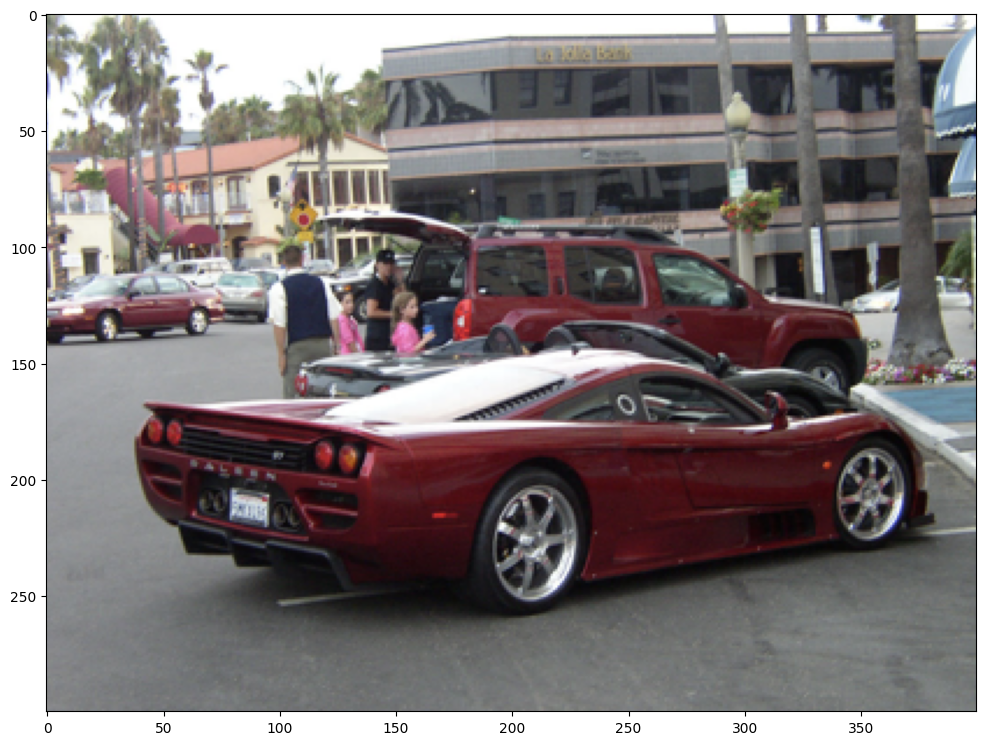

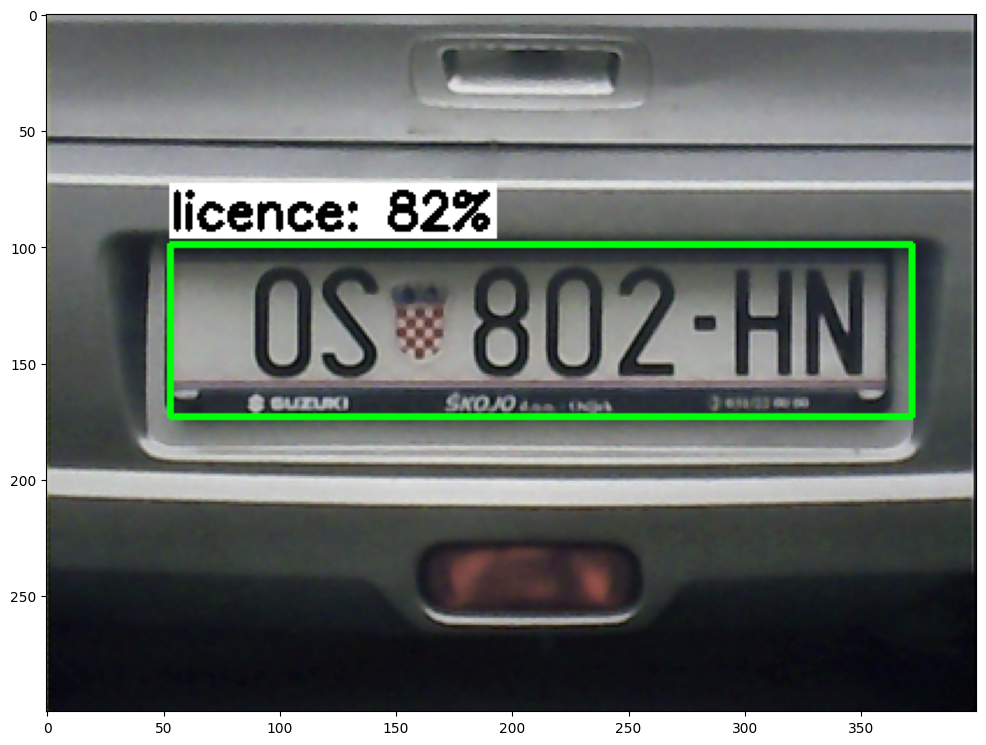

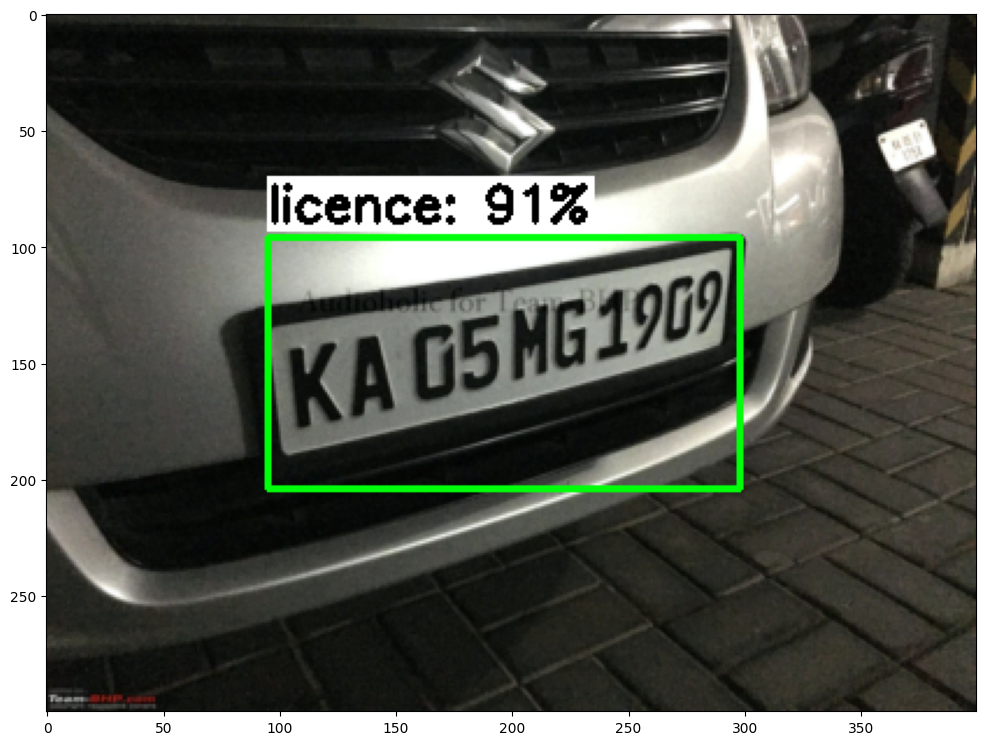

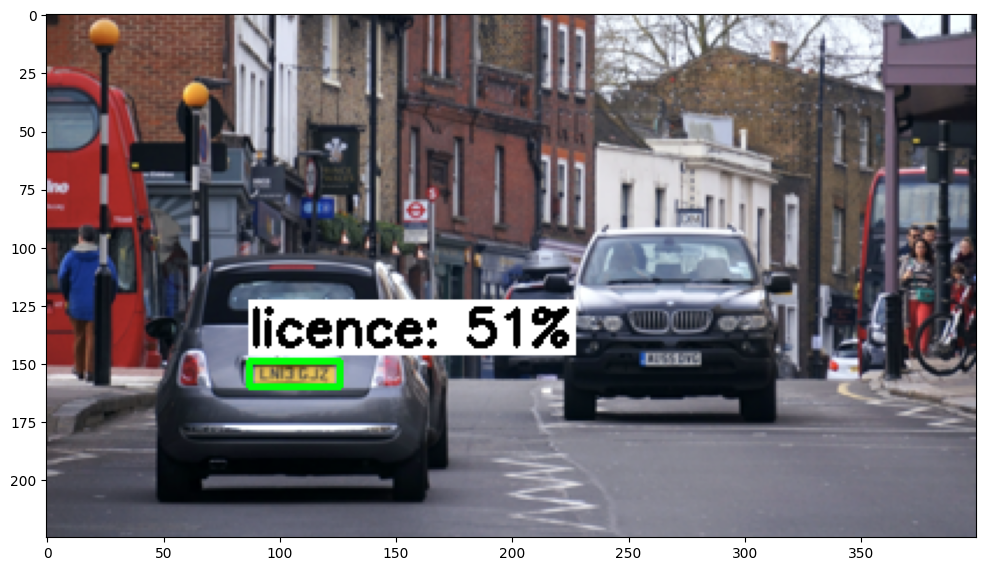

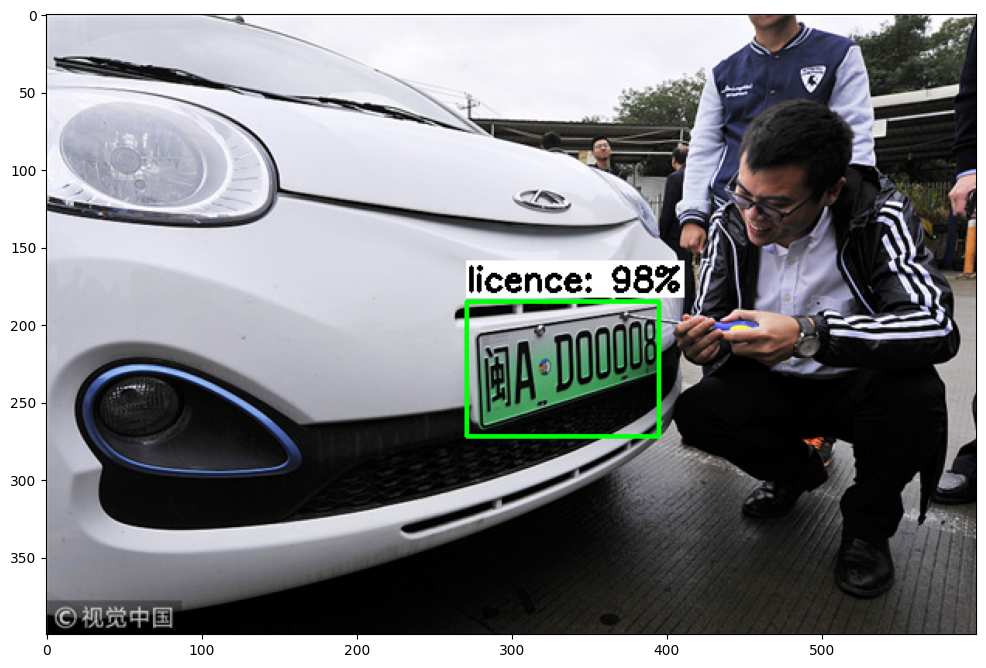

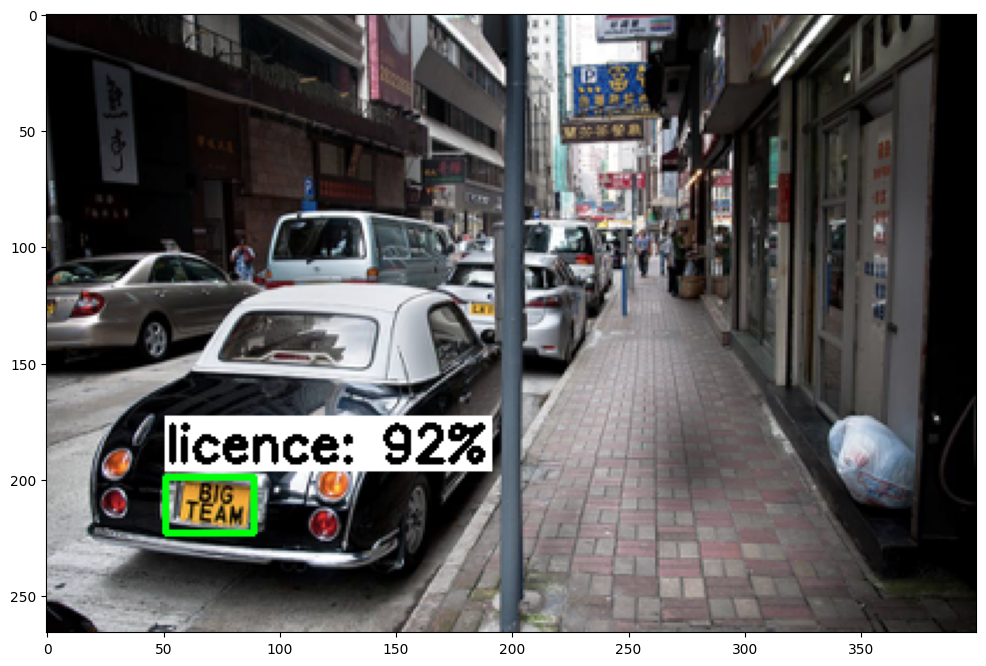

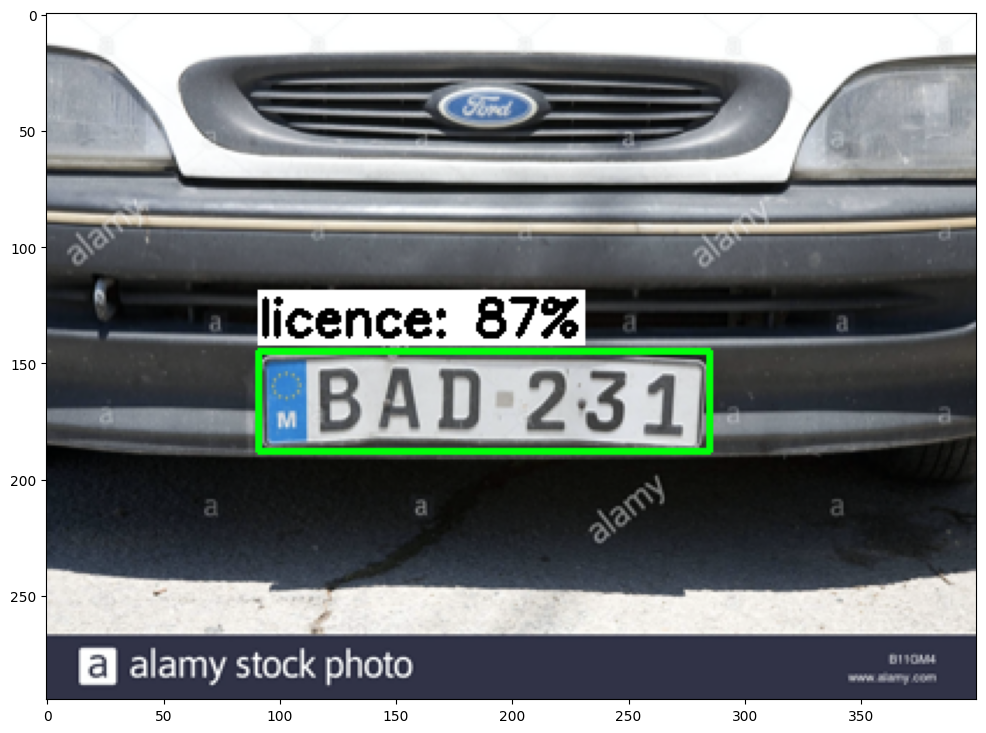

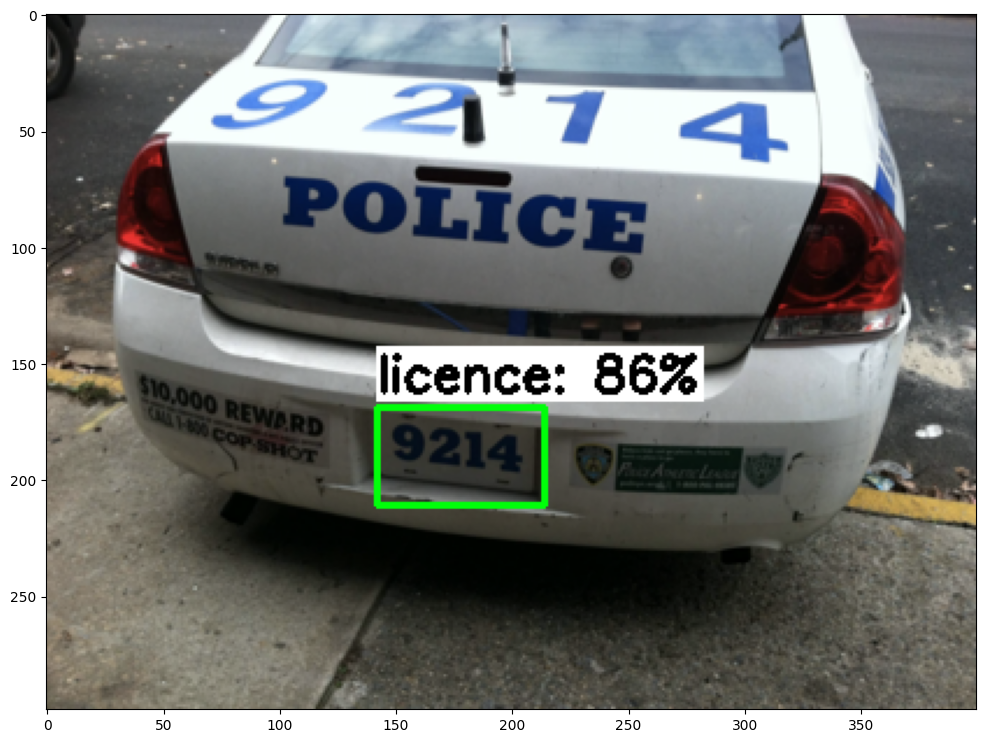

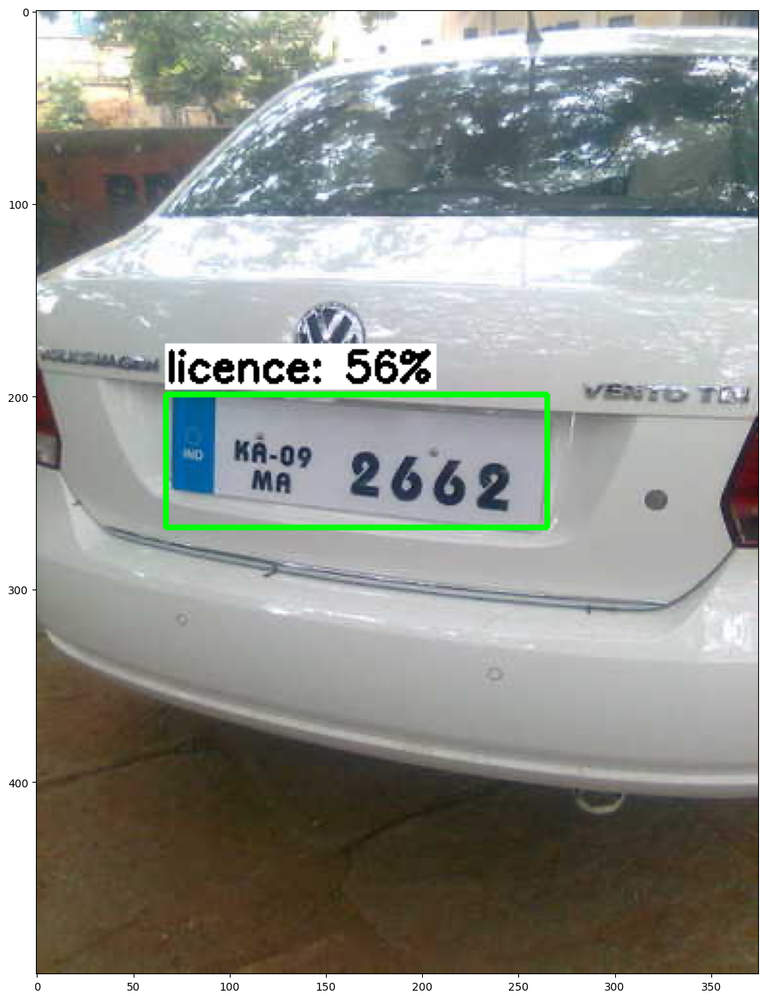

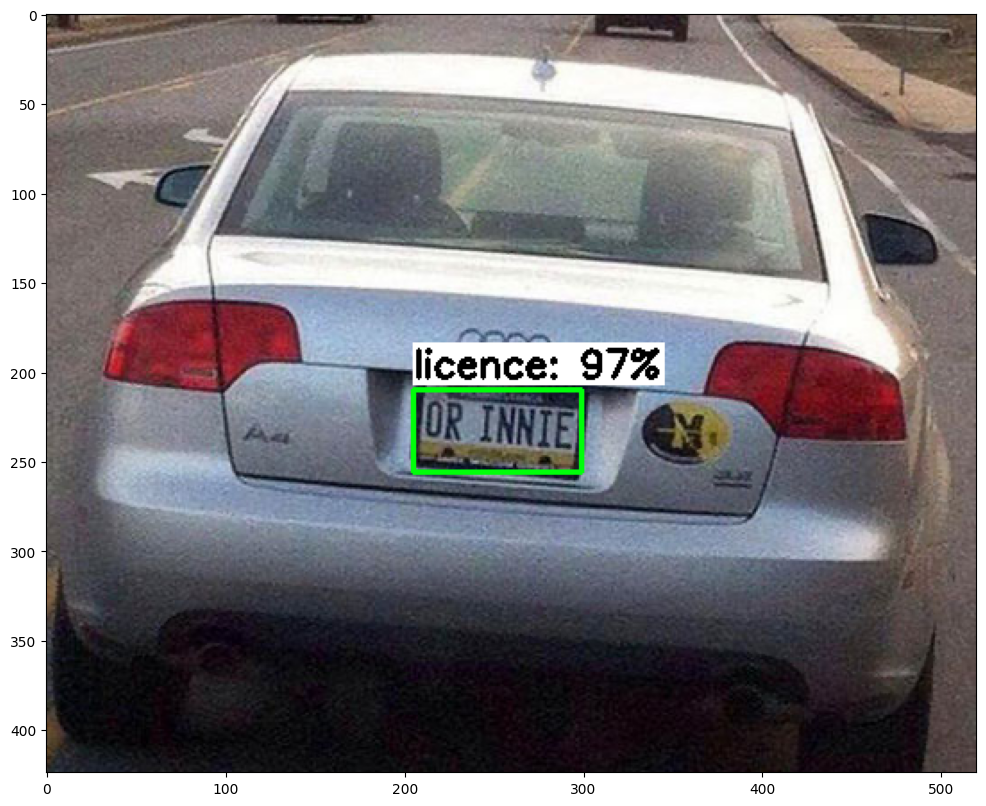

In [ ]:
# Set up variables for running user's model
PATH_TO_IMAGES='/content/images/test'   # Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/detect.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'   # Path to labelmap.txt file
min_conf_threshold=0.5   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10   # Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

# Loading the model

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

!cp /content/gdrive/MyDrive/ANPR/custom_model_lite.zip /content

Mounted at /content/gdrive


In [ ]:
import zipfile

# Replace 'file.zip' with the actual name of your zip file
zip_path = '/content/custom_model_lite.zip'
extract_path = '/content'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)


In [ ]:
import tensorflow as tf

In [ ]:
!git clone https://github.com/tensorflow/models.git


Cloning into 'models'...
remote: Enumerating objects: 87017, done.
remote: Counting objects: 100% (771/771), done.
remote: Compressing objects: 100% (392/392), done.
remote: Total 87017 (delta 440), reused 682 (delta 372), pack-reused 86246
Receiving objects: 100% (87017/87017), 599.08 MiB | 16.71 MiB/s, done.
Resolving deltas: 100% (62322/62322), done.


In [ ]:
!apt-get install -y protobuf-compiler python-lxml python-pil
!pip install -U Cython
!pip install tf_slim


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
E: Unable to locate package python-lxml
E: Unable to locate package python-pil
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 35.0 MB/s eta 0:00:00
  Attempting uninstall: Cython
    Found existing installation: Cython 0.29.36
    Uninstalling Cython-0.29.36:
      Successfully uninstalled Cython-0.29.36


In [ ]:
%cd /content/models/research/
!protoc object_detection/protos/*.proto --python_out=.
import os
os.environ['PYTHONPATH'] += ':/content/models/research/:/content/models/research/slim/'


/content/models/research


In [ ]:
import tensorflow as tf
from object_detection.utils import label_map_util

# Paths to the model and label map files
model_path = '/content/custom_model_lite/detect.tflite'
label_map_path = '/content/custom_model_lite/labelmap.pbtxt'

# Load the TFLite model
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

# Load the label map
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=90, use_display_name=True)
category_index = label_map_util.create_category_index(categories)


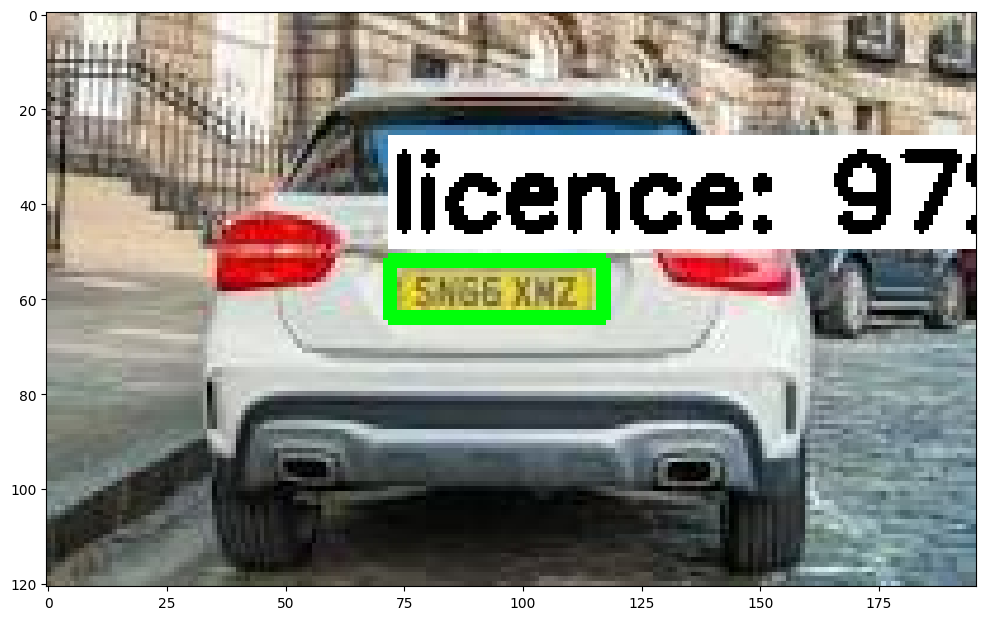

In [ ]:
# Set up variables for running user's model
PATH_TO_IMAGES='/content'   # Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/detect.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/custom_model_lite/labelmap.txt'   # Path to labelmap.txt file
min_conf_threshold=0.5   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 1   # Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

All components are functioning correctly. The upcoming phase of the project involves loading the model locally, executing real-time inference using a webcam, and applying Optical Character Recognition (OCR) to the predictions. This crucial step will be addressed in a separate notebook to ensure a focused and systematic approach.